<a href="https://colab.research.google.com/github/Sreelakshmijayarajan/yolo_model-training/blob/main/UGV_Person_Detection_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Mon Sep  7 16:43:12 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   59C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 76.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 kB 8.0 MB/s eta 0:00:00


In [ ]:
import ultralytics
print(ultralytics.__version__)

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
8.4.142


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls -lh "/content/drive/MyDrive/Datasets/"

ls: cannot access '/content/drive/MyDrive/Datasets/': No such file or directory


In [ ]:
!ls -lah "/content/drive/MyDrive/"

total 154M
drwx------ 2 root root 4.0K Sep  7 16:39 'Colab Notebooks'
-rw------- 1 root root 148M Sep  7 16:34  KITTI_PERSON_ready_to_train.zip
-rw------- 1 root root 414K Sep  8 05:01  test_images.zip
-rw------- 1 root root 5.2M Sep  7 17:33  UGV_person_detection_v1_best.pt


In [ ]:
!unzip -q "/content/drive/MyDrive/KITTI_PERSON_ready_to_train.zip" -d "/content/"

In [ ]:
!ls -lah "/content/KITTI_PERSON/"

total 24K
drwxr-xr-x 4 root root 4.0K Sep  7 16:52 .
drwxr-xr-x 1 root root 4.0K Sep  7 16:52 ..
-rw-r--r-- 1 root root   70 Sep  7 16:25 data.yaml
drwxr-xr-x 4 root root 4.0K Sep  7 16:52 images
drwxr-xr-x 4 root root 4.0K Sep  7 16:52 labels
-rw-r--r-- 1 root root  464 Sep  7 16:25 README.txt


In [ ]:
!echo "TRAIN IMAGES:"
!find /content/KITTI_PERSON/images/train -type f | wc -l

!echo "VAL IMAGES:"
!find /content/KITTI_PERSON/images/val -type f | wc -l

!echo "TRAIN LABELS:"
!find /content/KITTI_PERSON/labels/train -type f | wc -l

!echo "VAL LABELS:"
!find /content/KITTI_PERSON/labels/val -type f | wc -l

TRAIN IMAGES:
2329
VAL IMAGES:
604
TRAIN LABELS:
2329
VAL LABELS:
604


In [ ]:
!cat /content/KITTI_PERSON/data.yaml

path: .
train: images/train
val: images/val

nc: 1
names:
  0: person


In [ ]:
yaml_text = """path: /content/KITTI_PERSON
train: images/train
val: images/val

nc: 1
names:
  0: person
"""

with open("/content/KITTI_PERSON/data.yaml", "w") as f:
    f.write(yaml_text)

print("data.yaml fixed successfully!")

data.yaml fixed successfully!


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(
    data="/content/KITTI_PERSON/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    project="/content/UGV_training",
    name="person_detection_v1"
)

Ultralytics 8.4.142 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/KITTI_PERSON/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=person_detection_v1-6, nbs=64, nms=None, ops

In [ ]:
!cp /content/UGV_training/person_detection_v1-6/weights/best.pt \
"/content/drive/MyDrive/UGV_person_detection_v1_best.pt"

In [ ]:
!ls -lh "/content/drive/MyDrive/UGV_person_detection_v1_best.pt"

-rw------- 1 root root 5.2M Sep  7 17:33 /content/drive/MyDrive/UGV_person_detection_v1_best.pt


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")

In [ ]:
!rm -rf /content/test_images
!unzip -q "/content/drive/MyDrive/test_images.zip" -d /content/test_images

In [ ]:
!find /content/test_images -type f

/content/test_images/training images/7.jpeg
/content/test_images/training images/5.jpeg
/content/test_images/training images/3.jpeg
/content/test_images/training images/1.jpeg
/content/test_images/training images/4.jpeg
/content/test_images/training images/2.jpeg
/content/test_images/training images/6.jpeg


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")

results = model.predict(
    source="/content/test_images/training images",
    conf=0.25,
    save=True
)


image 1/7 /content/test_images/training images/1.jpeg: 384x640 1 person, 13.0ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 4 persons, 9.0ms
image 3/7 /content/test_images/training images/3.jpeg: 512x640 1 person, 53.9ms
image 4/7 /content/test_images/training images/4.jpeg: 480x640 2 persons, 47.7ms
image 5/7 /content/test_images/training images/5.jpeg: 640x448 2 persons, 46.4ms
image 6/7 /content/test_images/training images/6.jpeg: 384x640 1 person, 7.7ms
image 7/7 /content/test_images/training images/7.jpeg: 480x640 (no detections), 8.1ms
Speed: 15.3ms preprocess, 26.5ms inference, 7.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


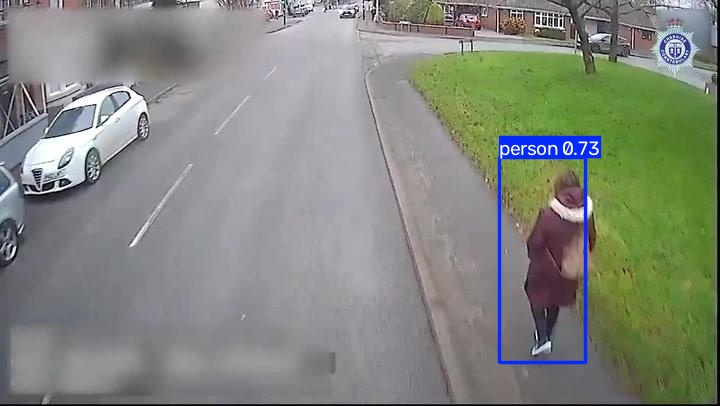

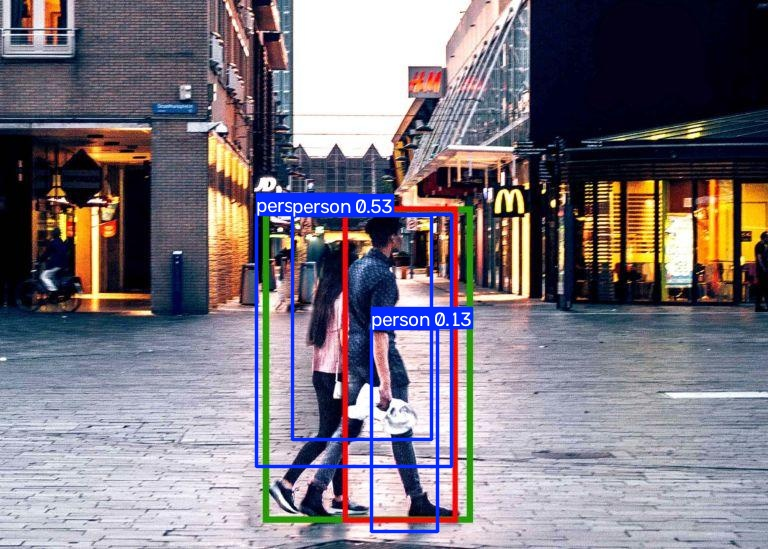

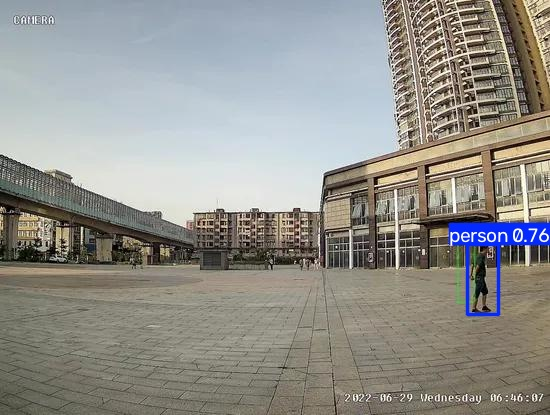

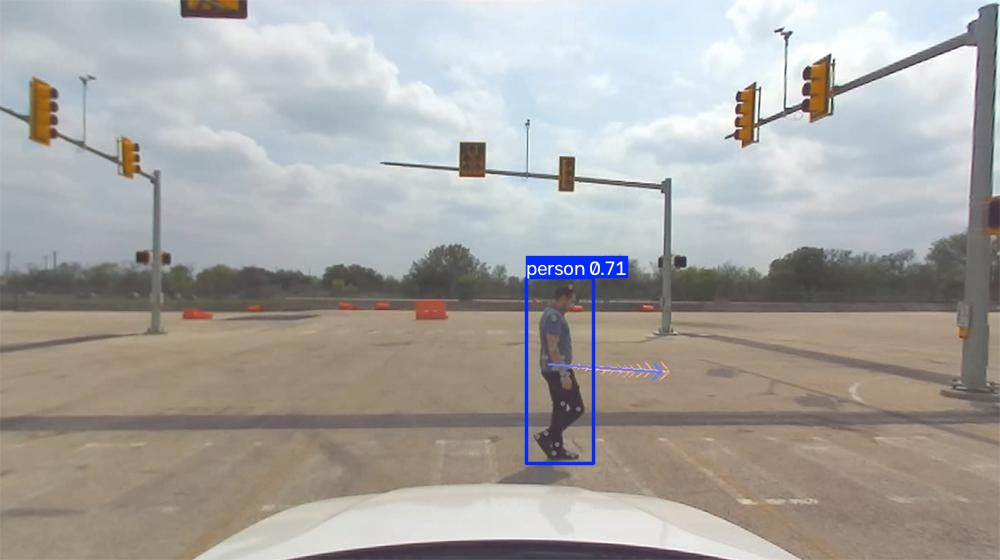

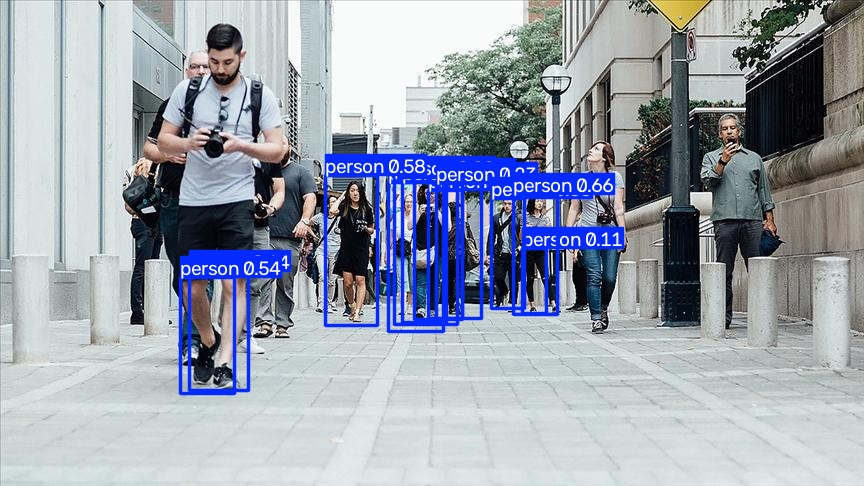

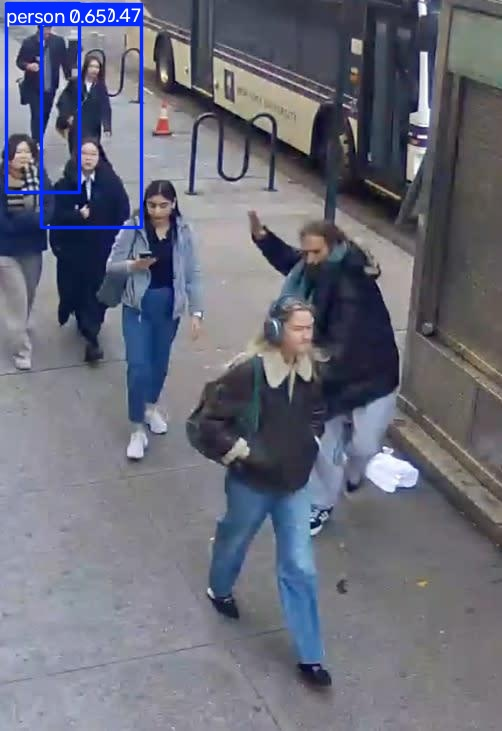

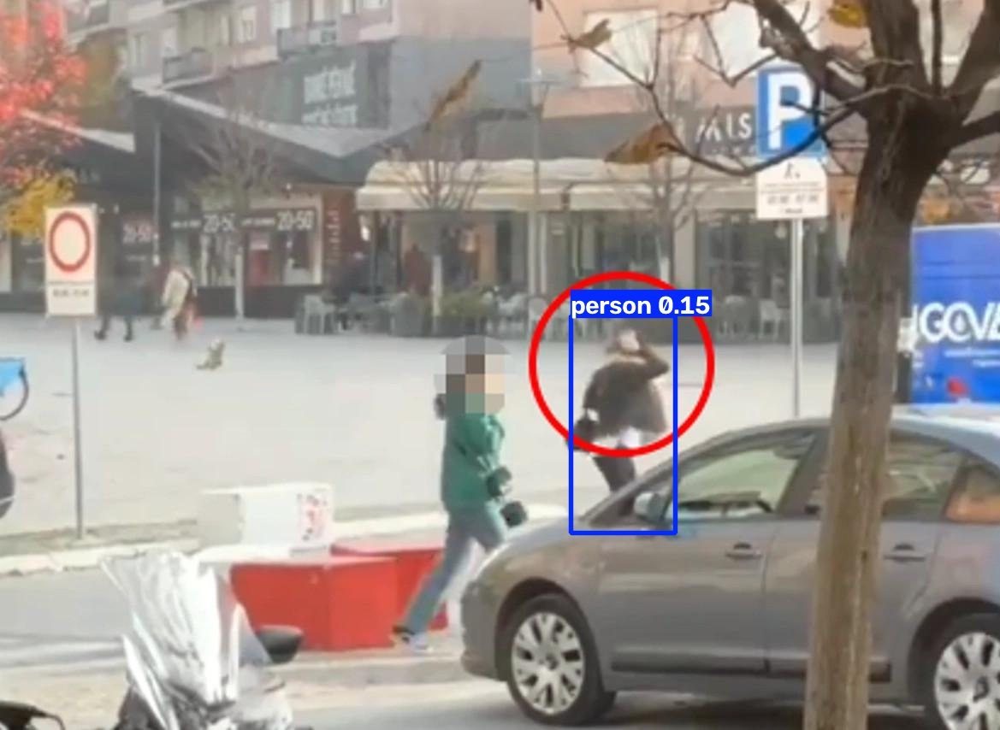

In [ ]:
from IPython.display import display, Image
import glob

for img in glob.glob("/content/runs/detect/predict/*"):
    display(Image(filename=img))

In [ ]:
results = model.predict(
    source="/content/test_images/training images",
    conf=0.10,
    save=True
)


image 1/7 /content/test_images/training images/1.jpeg: 384x640 1 person, 8.9ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 12 persons, 7.5ms
image 3/7 /content/test_images/training images/3.jpeg: 512x640 1 person, 8.1ms
image 4/7 /content/test_images/training images/4.jpeg: 480x640 3 persons, 8.1ms
image 5/7 /content/test_images/training images/5.jpeg: 640x448 2 persons, 8.2ms
image 6/7 /content/test_images/training images/6.jpeg: 384x640 1 person, 7.8ms
image 7/7 /content/test_images/training images/7.jpeg: 480x640 1 person, 8.3ms
Speed: 1.5ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict


In [ ]:
!pip install -q huggingface_hub

from huggingface_hub import HfApi

api = HfApi()

files = api.list_repo_files(
    repo_id="co-glance/Co-GLANCE",
    repo_type="dataset"
)

print("Total files:", len(files))

for f in files[:100]:
    print(f)

Total files: 139347
.gitattributes
03-30-Processed-release/metadata.yaml
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0000.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0001.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0002.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0003.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0004.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0005.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0006.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0007.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_tight_0008.npy
03-30-Processed-release/run_1/All/aerial/bounding_box_2d_tight/bounding_box_2d_ti

In [ ]:
# Find ground RGB and ground bounding-box files only

ground_files = [
    f for f in files
    if "/ground/" in f
]

rgb_files = [
    f for f in ground_files
    if "/rgb/" in f
]

bbox_files = [
    f for f in ground_files
    if "bounding_box_2d_tight" in f
]

print("Ground files :", len(ground_files))
print("Ground RGB   :", len(rgb_files))
print("Ground BBox  :", len(bbox_files))

print("\n--- Sample Ground RGB files ---")
for f in rgb_files[:20]:
    print(f)

print("\n--- Sample Ground BBox files ---")
for f in bbox_files[:20]:
    print(f)

Ground files : 98777
Ground RGB   : 5090
Ground BBox  : 8456

--- Sample Ground RGB files ---
03-30-Processed-release/run_1/All/ground/rgb/rgb_0000.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0001.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0002.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0003.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0004.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0005.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0006.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0007.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0008.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0009.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0010.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0011.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0012.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0013.png
03-30-Processed-release/run_1/All/ground/rgb/rgb_0014.png
03-30-Processed-release/run_1/All/gr

In [ ]:
# Show unique ground dataset sections

from collections import Counter

sections = Counter()

for f in rgb_files:
    parts = f.split("/")

    # Example:
    # 03-30-Processed-release/run_1/All/ground/rgb/rgb_0000.png
    if len(parts) >= 5:
        section = "/".join(parts[:4])
        sections[section] += 1

print("Ground RGB sections:\n")

for section, count in sections.items():
    print(f"{section}  -->  {count} images")

Ground RGB sections:

03-30-Processed-release/run_1/All/ground  -->  118 images
03-30-Processed-release/run_1/Clean/ground  -->  77 images
03-30-Processed-release/run_1/Filteredout/ground  -->  34 images
03-30-Processed-release/run_1/Multiperson/ground  -->  7 images
03-30-Processed-release/run_2/All/ground  -->  326 images
03-30-Processed-release/run_2/Clean/ground  -->  229 images
03-30-Processed-release/run_2/Filteredout/ground  -->  43 images
03-30-Processed-release/run_2/Multiperson/ground  -->  54 images
03-30-Processed-release/run_3/All/ground  -->  280 images
03-30-Processed-release/run_3/Clean/ground  -->  88 images
03-30-Processed-release/run_3/Filteredout/ground  -->  59 images
03-30-Processed-release/run_3/Multiperson/ground  -->  152 images
03-30-Processed-release/run_4/All/ground  -->  485 images
03-30-Processed-release/run_4/Clean/ground  -->  167 images
03-30-Processed-release/run_4/Filteredout/ground  -->  155 images
03-30-Processed-release/run_4/Multiperson/ground  --

In [ ]:
from huggingface_hub import hf_hub_download
import os

repo_id = "co-glance/Co-GLANCE"

# Selected sections
selected_sections = [
    "04-13-Processed-release/run_1/Clean/ground",
    "04-13-Processed-release/run_1/PartialOcclusion/ground",
    "04-13-Processed-release/run_1/FullOcclusion/ground",

    "04-13-Processed-release/run_2/Clean/ground",
    "04-13-Processed-release/run_2/PartialOcclusion/ground",
    "04-13-Processed-release/run_2/FullOcclusion/ground",

    "04-13-Processed-release/run_3/Clean/ground",
    "04-13-Processed-release/run_3/PartialOcclusion/ground",
    "04-13-Processed-release/run_3/FullOcclusion/ground",
]

# Find RGB + matching bbox files
selected_rgb = [
    f for f in rgb_files
    if any(f.startswith(section + "/") for section in selected_sections)
]

selected_bbox = [
    f for f in bbox_files
    if any(f.startswith(section + "/") for section in selected_sections)
]

print("RGB files selected :", len(selected_rgb))
print("BBox files selected:", len(selected_bbox))

print("\nFirst RGB:")
for f in selected_rgb[:5]:
    print(f)

print("\nFirst BBox:")
for f in selected_bbox[:5]:
    print(f)

RGB files selected : 1724
BBox files selected: 1724

First RGB:
04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0000.png
04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0005.png
04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0006.png
04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0007.png
04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0008.png

First BBox:
04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0000.npy
04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0005.npy
04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0006.npy
04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0007.npy
04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0008.npy


In [ ]:
from huggingface_hub import hf_hub_download
import numpy as np
from PIL import Image

repo_id = "co-glance/Co-GLANCE"

rgb_file = selected_rgb[0]
bbox_file = selected_bbox[0]

rgb_path = hf_hub_download(
    repo_id=repo_id,
    filename=rgb_file,
    repo_type="dataset"
)

bbox_path = hf_hub_download(
    repo_id=repo_id,
    filename=bbox_file,
    repo_type="dataset"
)

print("RGB:", rgb_path)
print("BBox:", bbox_path)

img = Image.open(rgb_path)
bbox = np.load(bbox_path, allow_pickle=True)

print("Image size:", img.size)
print("BBox shape:", bbox.shape)
print("BBox data:")
print(bbox)

04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B / 1.50MB            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            

04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            

RGB: /root/.cache/huggingface/hub/datasets--co-glance--Co-GLANCE/snapshots/3182801c92bf65d4c64f26aacb7eb166307080d0/04-13-Processed-release/run_1/Clean/ground/rgb/rgb_0000.png
BBox: /root/.cache/huggingface/hub/datasets--co-glance--Co-GLANCE/snapshots/3182801c92bf65d4c64f26aacb7eb166307080d0/04-13-Processed-release/run_1/Clean/ground/bounding_box_2d_tight/bounding_box_2d_tight_0000.npy
Image size: (1200, 900)
BBox shape: (2,)
BBox data:
[(0, 673,  11, 768, 287,     0.26344) (0, 857, 167, 923, 304,     0.56193)]


In [ ]:
# Inspect several BBox files to understand the annotation format

import numpy as np

for bbox_file in selected_bbox[:10]:

    bbox_path = hf_hub_download(
        repo_id=repo_id,
        filename=bbox_file,
        repo_type="dataset"
    )

    data = np.load(bbox_path, allow_pickle=True)

    print("\nFILE:", bbox_file.split("/")[-1])
    print("Shape:", data.shape)
    print("Dtype:", data.dtype)
    print("Data:")
    print(data)



FILE: bounding_box_2d_tight_0000.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 673,  11, 768, 287,     0.26344) (0, 857, 167, 923, 304,     0.56193)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0005.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 761,  96, 846, 309,     0.15051) (0, 816, 236, 846, 308,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0006.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 795, 132, 901, 326,    0.080266) (0, 807, 240, 832, 300,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0007.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 820, 143, 926, 334,    0.088153) (0, 803, 240, 835, 300,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0008.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 855, 167, 946, 355,     0.16205) (0, 802, 247, 834, 298,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0009.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 876, 175, 957, 369,    0.089231) (0, 814, 257, 842, 313,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0010.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 751, 175, 822, 353,     0.18421) (0, 720, 252, 748, 306,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0016.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 632, 123, 696, 292,     0.08968) (0, 762, 229, 813, 307,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0017.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 649, 182, 714, 351,    0.081167) (0, 777, 276, 813, 361,           0)]


04-13-Processed-release/run_1/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_1/Clean/grou(…): downloading bytes:           |  0.00B            


FILE: bounding_box_2d_tight_0018.npy
Shape: (2,)
Dtype: [('semanticId', '<u4'), ('x_min', '<i4'), ('y_min', '<i4'), ('x_max', '<i4'), ('y_max', '<i4'), ('occlusionRatio', '<f4')]
Data:
[(0, 656, 148, 723, 306,     0.14161) (0, 792, 225, 838, 329,           0)]


In [ ]:
import numpy as np
from PIL import Image
from huggingface_hub import hf_hub_download

# Use the first selected image
rgb_file = selected_rgb[0]
bbox_file = selected_bbox[0]

# Fetch files from Hugging Face
rgb_path = hf_hub_download(
    repo_id=repo_id,
    filename=rgb_file,
    repo_type="dataset"
)

bbox_path = hf_hub_download(
    repo_id=repo_id,
    filename=bbox_file,
    repo_type="dataset"
)

# Image dimensions
img = Image.open(rgb_path)
img_w, img_h = img.size

# Load bounding boxes
boxes = np.load(bbox_path, allow_pickle=True)

print("Image size:", img_w, "x", img_h)
print("Number of persons:", len(boxes))

# Convert each bounding box to YOLO format
yolo_labels = []

for box in boxes:

    x_min = float(box["x_min"])
    y_min = float(box["y_min"])
    x_max = float(box["x_max"])
    y_max = float(box["y_max"])

    # YOLO format
    x_center = ((x_min + x_max) / 2) / img_w
    y_center = ((y_min + y_max) / 2) / img_h
    width = (x_max - x_min) / img_w
    height = (y_max - y_min) / img_h

    # class 0 = person
    yolo_labels.append(
        f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
    )

print("\nYOLO labels:\n")

for label in yolo_labels:
    print(label)

Image size: 1200 x 900
Number of persons: 2

YOLO labels:

0 0.600417 0.165556 0.079167 0.306667
0 0.741667 0.261667 0.055000 0.152222


In [ ]:
import os
import shutil
import random
import numpy as np
from PIL import Image
from tqdm import tqdm
from huggingface_hub import hf_hub_download

# ==============================
# SETTINGS
# ==============================

repo_id = "co-glance/Co-GLANCE"

output_dir = "/content/CoGLANCE_YOLO"

random.seed(42)

# Create folders
for folder in [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]:
    os.makedirs(os.path.join(output_dir, folder), exist_ok=True)

# ==============================
# MATCH RGB ↔ BBOX
# ==============================

bbox_dict = {}

for f in selected_bbox:
    filename = os.path.basename(f)

    # bounding_box_2d_tight_0000.npy
    frame_id = filename.replace(
        "bounding_box_2d_tight_", ""
    ).replace(".npy", "")

    bbox_dict[
        f.rsplit("/bounding_box_2d_tight/", 1)[0] + "/" + frame_id
    ] = f

# ==============================
# BUILD RGB/BBOX PAIRS
# ==============================

pairs = []

for rgb_file in selected_rgb:

    filename = os.path.basename(rgb_file)

    # rgb_0000.png → 0000
    frame_id = filename.replace(
        "rgb_", ""
    ).replace(".png", "")

    base = rgb_file.rsplit("/rgb/", 1)[0]

    bbox_file = (
        base
        + "/bounding_box_2d_tight/"
        + "bounding_box_2d_tight_"
        + frame_id
        + ".npy"
    )

    if bbox_file in bbox_files:
        pairs.append((rgb_file, bbox_file))

print("Matched pairs:", len(pairs))

# ==============================
# SHUFFLE + TRAIN/VAL SPLIT
# ==============================

random.shuffle(pairs)

split_index = int(len(pairs) * 0.8)

train_pairs = pairs[:split_index]
val_pairs = pairs[split_index:]

print("Train:", len(train_pairs))
print("Val  :", len(val_pairs))

# ==============================
# CONVERSION FUNCTION
# ==============================

def process_pair(rgb_file, bbox_file, split, index):

    # Download RGB
    rgb_path = hf_hub_download(
        repo_id=repo_id,
        filename=rgb_file,
        repo_type="dataset"
    )

    # Download BBox
    bbox_path = hf_hub_download(
        repo_id=repo_id,
        filename=bbox_file,
        repo_type="dataset"
    )

    # Image dimensions
    img = Image.open(rgb_path)
    img_w, img_h = img.size

    # New unique filename
    new_name = f"coglance_{index:05d}"

    image_output = os.path.join(
        output_dir,
        "images",
        split,
        new_name + ".png"
    )

    label_output = os.path.join(
        output_dir,
        "labels",
        split,
        new_name + ".txt"
    )

    # Copy image
    shutil.copy2(rgb_path, image_output)

    # Load annotations
    boxes = np.load(
        bbox_path,
        allow_pickle=True
    )

    labels = []

    for box in boxes:

        x_min = float(box["x_min"])
        y_min = float(box["y_min"])
        x_max = float(box["x_max"])
        y_max = float(box["y_max"])

        # Safety check
        x_min = max(0, min(x_min, img_w))
        x_max = max(0, min(x_max, img_w))
        y_min = max(0, min(y_min, img_h))
        y_max = max(0, min(y_max, img_h))

        if x_max <= x_min or y_max <= y_min:
            continue

        # YOLO normalized format
        x_center = ((x_min + x_max) / 2) / img_w
        y_center = ((y_min + y_max) / 2) / img_h

        width = (x_max - x_min) / img_w
        height = (y_max - y_min) / img_h

        # class 0 = person
        labels.append(
            f"0 {x_center:.6f} {y_center:.6f} "
            f"{width:.6f} {height:.6f}"
        )

    # Write YOLO label
    with open(label_output, "w") as f:
        f.write("\n".join(labels))


# ==============================
# PROCESS TRAIN
# ==============================

print("\nProcessing TRAIN...")

for i, (rgb, bbox) in enumerate(
    tqdm(train_pairs)
):
    process_pair(
        rgb,
        bbox,
        "train",
        i
    )


# ==============================
# PROCESS VAL
# ==============================

print("\nProcessing VAL...")

for i, (rgb, bbox) in enumerate(
    tqdm(val_pairs)
):
    process_pair(
        rgb,
        bbox,
        "val",
        i + len(train_pairs)
    )


# ==============================
# CREATE data.yaml
# ==============================

yaml_content = f"""path: {output_dir}
train: images/train
val: images/val

nc: 1
names:
  0: person
"""

with open(
    os.path.join(output_dir, "data.yaml"),
    "w"
) as f:
    f.write(yaml_content)

print("\n================================")
print("✅ Co-GLANCE YOLO DATASET READY")
print("================================")
print("Dataset:", output_dir)
print("Train:", len(train_pairs))
print("Val:", len(val_pairs))
print("Classes: 1 (person)")

In [ ]:
from huggingface_hub import snapshot_download

repo_id = "co-glance/Co-GLANCE"
raw_dir = "/content/CoGLANCE_raw"

# Selected RGB + BBox files
patterns = selected_rgb + selected_bbox

print("Files to download:", len(patterns))
print("Starting parallel download...")

snapshot_download(
    repo_id=repo_id,
    repo_type="dataset",
    local_dir=raw_dir,
    allow_patterns=patterns,
    max_workers=16
)

print("\n✅ Download completed!")
print("Raw dataset location:", raw_dir)

Files to download: 3448
Starting parallel download...


KeyboardInterrupt: 

In [ ]:
# ============================================
# 🚀 Co-GLANCE DOWNLOAD WITH LIVE PROGRESS
# ============================================

import os
import time
from huggingface_hub import hf_hub_download

repo_id = "co-glance/Co-GLANCE"
raw_dir = "/content/CoGLANCE_raw"

patterns = selected_rgb + selected_bbox
total = len(patterns)

os.makedirs(raw_dir, exist_ok=True)

print(f"📦 Total files: {total}")
print("🚀 Downloading...\n")

start_time = time.time()

for i, file in enumerate(patterns, 1):

    local_path = os.path.join(raw_dir, file)
    os.makedirs(os.path.dirname(local_path), exist_ok=True)

    if not os.path.exists(local_path):
        downloaded_path = hf_hub_download(
            repo_id=repo_id,
            filename=file,
            repo_type="dataset"
        )

        # Copy from HF cache to raw folder
        import shutil
        shutil.copy2(downloaded_path, local_path)

    # Progress
    percent = (i / total) * 100
    bar_length = 30
    filled = int(bar_length * i / total)
    bar = "█" * filled + "░" * (bar_length - filled)

    elapsed = time.time() - start_time
    speed = i / elapsed if elapsed > 0 else 0
    remaining = (total - i) / speed if speed > 0 else 0

    mins = int(remaining // 60)
    secs = int(remaining % 60)

    print(
        f"\rDownloading: {percent:6.2f}% "
        f"{bar} | {i}/{total} | ETA: {mins:02d}:{secs:02d}",
        end="",
        flush=True
    )

print("\n\n======================================")
print("✅ DOWNLOAD COMPLETED")
print("======================================")
print(f"Total files: {total}")
print(f"Location: {raw_dir}")

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.08% █████████████████████████░░░░░ | 2899/3448 | ETA: 09:38

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.11% █████████████████████████░░░░░ | 2900/3448 | ETA: 09:37

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.14% █████████████████████████░░░░░ | 2901/3448 | ETA: 09:36

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.16% █████████████████████████░░░░░ | 2902/3448 | ETA: 09:35

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.22% █████████████████████████░░░░░ | 2904/3448 | ETA: 09:33

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.31% █████████████████████████░░░░░ | 2907/3448 | ETA: 09:30

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.37% █████████████████████████░░░░░ | 2909/3448 | ETA: 09:28

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.40% █████████████████████████░░░░░ | 2910/3448 | ETA: 09:27

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.43% █████████████████████████░░░░░ | 2911/3448 | ETA: 09:26

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.48% █████████████████████████░░░░░ | 2913/3448 | ETA: 09:23

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.51% █████████████████████████░░░░░ | 2914/3448 | ETA: 09:23

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.54% █████████████████████████░░░░░ | 2915/3448 | ETA: 09:22

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.57% █████████████████████████░░░░░ | 2916/3448 | ETA: 09:21

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.60% █████████████████████████░░░░░ | 2917/3448 | ETA: 09:20

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.66% █████████████████████████░░░░░ | 2919/3448 | ETA: 09:17

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.69% █████████████████████████░░░░░ | 2920/3448 | ETA: 09:17

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.72% █████████████████████████░░░░░ | 2921/3448 | ETA: 09:16

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.80% █████████████████████████░░░░░ | 2924/3448 | ETA: 09:12

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.83% █████████████████████████░░░░░ | 2925/3448 | ETA: 09:11

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.86% █████████████████████████░░░░░ | 2926/3448 | ETA: 09:10

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.89% █████████████████████████░░░░░ | 2927/3448 | ETA: 09:09

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.95% █████████████████████████░░░░░ | 2929/3448 | ETA: 09:07

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  84.98% █████████████████████████░░░░░ | 2930/3448 | ETA: 09:06

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  85.01% █████████████████████████░░░░░ | 2931/3448 | ETA: 09:05

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  85.06% █████████████████████████░░░░░ | 2933/3448 | ETA: 09:03

04-13-Processed-release/run_2/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_2/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  87.24% ██████████████████████████░░░░ | 3008/3448 | ETA: 07:38

bounding_box_2d_tight_labels_0185.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

Downloading:  87.27% ██████████████████████████░░░░ | 3009/3448 | ETA: 07:37

bounding_box_2d_tight_labels_0186.json:   0%|          | 0.00/113 [00:00<?, ?B/s]

Downloading:  91.50% ███████████████████████████░░░ | 3155/3448 | ETA: 04:57

bounding_box_2d_tight_labels_0424.json:   0%|          | 0.00/225 [00:00<?, ?B/s]

Downloading:  92.49% ███████████████████████████░░░ | 3189/3448 | ETA: 04:21

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.52% ███████████████████████████░░░ | 3190/3448 | ETA: 04:20

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.55% ███████████████████████████░░░ | 3191/3448 | ETA: 04:19

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.58% ███████████████████████████░░░ | 3192/3448 | ETA: 04:18

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.60% ███████████████████████████░░░ | 3193/3448 | ETA: 04:17

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.63% ███████████████████████████░░░ | 3194/3448 | ETA: 04:17

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.72% ███████████████████████████░░░ | 3197/3448 | ETA: 04:13

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.78% ███████████████████████████░░░ | 3199/3448 | ETA: 04:11

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.81% ███████████████████████████░░░ | 3200/3448 | ETA: 04:10

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.84% ███████████████████████████░░░ | 3201/3448 | ETA: 04:09

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.87% ███████████████████████████░░░ | 3202/3448 | ETA: 04:08

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.89% ███████████████████████████░░░ | 3203/3448 | ETA: 04:08

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.92% ███████████████████████████░░░ | 3204/3448 | ETA: 04:07

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.95% ███████████████████████████░░░ | 3205/3448 | ETA: 04:06

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  92.98% ███████████████████████████░░░ | 3206/3448 | ETA: 04:05

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.01% ███████████████████████████░░░ | 3207/3448 | ETA: 04:04

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.04% ███████████████████████████░░░ | 3208/3448 | ETA: 04:03

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.07% ███████████████████████████░░░ | 3209/3448 | ETA: 04:02

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.13% ███████████████████████████░░░ | 3211/3448 | ETA: 04:00

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.18% ███████████████████████████░░░ | 3213/3448 | ETA: 03:58

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.21% ███████████████████████████░░░ | 3214/3448 | ETA: 03:57

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.27% ███████████████████████████░░░ | 3216/3448 | ETA: 03:55

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.30% ███████████████████████████░░░ | 3217/3448 | ETA: 03:54

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.33% ███████████████████████████░░░ | 3218/3448 | ETA: 03:53

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.36% ████████████████████████████░░ | 3219/3448 | ETA: 03:52

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.39% ████████████████████████████░░ | 3220/3448 | ETA: 03:51

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.42% ████████████████████████████░░ | 3221/3448 | ETA: 03:50

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.45% ████████████████████████████░░ | 3222/3448 | ETA: 03:49

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.50% ████████████████████████████░░ | 3224/3448 | ETA: 03:47

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.53% ████████████████████████████░░ | 3225/3448 | ETA: 03:46

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.59% ████████████████████████████░░ | 3227/3448 | ETA: 03:44

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.62% ████████████████████████████░░ | 3228/3448 | ETA: 03:43

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.65% ████████████████████████████░░ | 3229/3448 | ETA: 03:42

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.68% ████████████████████████████░░ | 3230/3448 | ETA: 03:41

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.74% ████████████████████████████░░ | 3232/3448 | ETA: 03:39

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.76% ████████████████████████████░░ | 3233/3448 | ETA: 03:38

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.85% ████████████████████████████░░ | 3236/3448 | ETA: 03:35

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  93.88% ████████████████████████████░░ | 3237/3448 | ETA: 03:34

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.00% ████████████████████████████░░ | 3241/3448 | ETA: 03:30

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.03% ████████████████████████████░░ | 3242/3448 | ETA: 03:29

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.05% ████████████████████████████░░ | 3243/3448 | ETA: 03:28

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.08% ████████████████████████████░░ | 3244/3448 | ETA: 03:27

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.11% ████████████████████████████░░ | 3245/3448 | ETA: 03:26

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.20% ████████████████████████████░░ | 3248/3448 | ETA: 03:23

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.23% ████████████████████████████░░ | 3249/3448 | ETA: 03:22

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.26% ████████████████████████████░░ | 3250/3448 | ETA: 03:21

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.29% ████████████████████████████░░ | 3251/3448 | ETA: 03:20

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.32% ████████████████████████████░░ | 3252/3448 | ETA: 03:19

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  94.37% ████████████████████████████░░ | 3254/3448 | ETA: 03:17

04-13-Processed-release/run_3/Clean/grou(…): reconstructing file:   0%|          |  0.00B /   304B            

04-13-Processed-release/run_3/Clean/grou(…): downloading bytes:           |  0.00B            

Downloading:  97.27% █████████████████████████████░ | 3354/3448 | ETA: 01:33

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.33% █████████████████████████████░ | 3356/3448 | ETA: 01:31

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.36% █████████████████████████████░ | 3357/3448 | ETA: 01:30

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.45% █████████████████████████████░ | 3360/3448 | ETA: 01:27

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.48% █████████████████████████████░ | 3361/3448 | ETA: 01:26

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.51% █████████████████████████████░ | 3362/3448 | ETA: 01:25

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.53% █████████████████████████████░ | 3363/3448 | ETA: 01:24

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.62% █████████████████████████████░ | 3366/3448 | ETA: 01:21

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.68% █████████████████████████████░ | 3368/3448 | ETA: 01:19

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.71% █████████████████████████████░ | 3369/3448 | ETA: 01:18

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.74% █████████████████████████████░ | 3370/3448 | ETA: 01:18

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.77% █████████████████████████████░ | 3371/3448 | ETA: 01:17

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.80% █████████████████████████████░ | 3372/3448 | ETA: 01:16

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.85% █████████████████████████████░ | 3374/3448 | ETA: 01:14

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.88% █████████████████████████████░ | 3375/3448 | ETA: 01:13

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.91% █████████████████████████████░ | 3376/3448 | ETA: 01:12

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  97.97% █████████████████████████████░ | 3378/3448 | ETA: 01:10

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.03% █████████████████████████████░ | 3380/3448 | ETA: 01:08

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.06% █████████████████████████████░ | 3381/3448 | ETA: 01:07

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.09% █████████████████████████████░ | 3382/3448 | ETA: 01:06

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.14% █████████████████████████████░ | 3384/3448 | ETA: 01:04

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.17% █████████████████████████████░ | 3385/3448 | ETA: 01:03

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.20% █████████████████████████████░ | 3386/3448 | ETA: 01:02

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.23% █████████████████████████████░ | 3387/3448 | ETA: 01:01

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.26% █████████████████████████████░ | 3388/3448 | ETA: 01:00

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.29% █████████████████████████████░ | 3389/3448 | ETA: 00:59

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.32% █████████████████████████████░ | 3390/3448 | ETA: 00:58

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.35% █████████████████████████████░ | 3391/3448 | ETA: 00:57

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.38% █████████████████████████████░ | 3392/3448 | ETA: 00:56

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.40% █████████████████████████████░ | 3393/3448 | ETA: 00:55

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.43% █████████████████████████████░ | 3394/3448 | ETA: 00:54

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.46% █████████████████████████████░ | 3395/3448 | ETA: 00:53

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.55% █████████████████████████████░ | 3398/3448 | ETA: 00:50

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.58% █████████████████████████████░ | 3399/3448 | ETA: 00:49

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading:  98.61% █████████████████████████████░ | 3400/3448 | ETA: 00:48

04-13-Processed-release/run_3/PartialOcc(…): reconstructing file:   0%|          |  0.00B /   280B            

04-13-Processed-release/run_3/PartialOcc(…): downloading bytes:           |  0.00B            

Downloading: 100.00% ██████████████████████████████ | 3448/3448 | ETA: 00:00

✅ DOWNLOAD COMPLETED
Total files: 3448
Location: /content/CoGLANCE_raw
📦 Total files: 3448
🚀 Downloading...

Downloading: 100.00% ██████████████████████████████ | 3448/3448 | ETA: 00:00

✅ DOWNLOAD COMPLETED
Total files: 3448
Location: /content/CoGLANCE_raw


In [ ]:
# ============================================
# 🚀 STEP 8 — Co-GLANCE → YOLO CONVERSION
# ============================================

import os
import shutil
import numpy as np
from PIL import Image
from tqdm.auto import tqdm

raw_dir = "/content/CoGLANCE_raw"
output_dir = "/content/CoGLANCE_YOLO"

# --------------------------------------------
# CREATE YOLO FOLDERS
# --------------------------------------------

for folder in [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]:
    os.makedirs(
        os.path.join(output_dir, folder),
        exist_ok=True
    )

# --------------------------------------------
# GET DOWNLOADED RGB FILES
# --------------------------------------------

rgb_files = []

for root, dirs, files in os.walk(raw_dir):
    for file in files:
        if file.startswith("rgb_") and file.endswith(".png"):
            full_path = os.path.join(root, file)
            rgb_files.append(full_path)

print("📸 RGB images found:", len(rgb_files))

# --------------------------------------------
# MATCH RGB → BBOX
# --------------------------------------------

pairs = []

for rgb_path in rgb_files:

    # Example:
    # .../ground/rgb/rgb_0000.png

    frame_id = os.path.basename(rgb_path)
    frame_id = frame_id.replace("rgb_", "").replace(".png", "")

    # Replace /rgb/rgb_xxxx.png
    # with /bounding_box_2d_tight/bounding_box_2d_tight_xxxx.npy

    bbox_path = rgb_path.replace(
        "/rgb/rgb_",
        "/bounding_box_2d_tight/bounding_box_2d_tight_"
    ).replace(
        ".png",
        ".npy"
    )

    if os.path.exists(bbox_path):
        pairs.append((rgb_path, bbox_path))

print("🔗 Matched pairs:", len(pairs))

# --------------------------------------------
# RUN-BASED TRAIN / VAL SPLIT
# --------------------------------------------

train_pairs = []
val_pairs = []

for rgb_path, bbox_path in pairs:

    if "/run_1/" in rgb_path or "/run_2/" in rgb_path:
        train_pairs.append((rgb_path, bbox_path))

    elif "/run_3/" in rgb_path:
        val_pairs.append((rgb_path, bbox_path))

print("\n======================================")
print("📊 DATASET SPLIT")
print("======================================")
print("Train:", len(train_pairs))
print("Val  :", len(val_pairs))
print("Total:", len(train_pairs) + len(val_pairs))
print("======================================")

# --------------------------------------------
# CONVERSION FUNCTION
# --------------------------------------------

def convert_pair(rgb_path, bbox_path, split, index):

    # Read image
    img = Image.open(rgb_path)
    img_w, img_h = img.size

    # New filename
    new_name = f"coglance_{index:05d}"

    image_out = os.path.join(
        output_dir,
        "images",
        split,
        new_name + ".png"
    )

    label_out = os.path.join(
        output_dir,
        "labels",
        split,
        new_name + ".txt"
    )

    # Copy image
    shutil.copy2(rgb_path, image_out)

    # Read bounding boxes
    boxes = np.load(
        bbox_path,
        allow_pickle=True
    )

    labels = []

    for box in boxes:

        x_min = float(box["x_min"])
        y_min = float(box["y_min"])
        x_max = float(box["x_max"])
        y_max = float(box["y_max"])

        # Clamp coordinates
        x_min = max(0, min(x_min, img_w))
        x_max = max(0, min(x_max, img_w))
        y_min = max(0, min(y_min, img_h))
        y_max = max(0, min(y_max, img_h))

        # Invalid box → skip
        if x_max <= x_min or y_max <= y_min:
            continue

        # YOLO format
        x_center = ((x_min + x_max) / 2) / img_w
        y_center = ((y_min + y_max) / 2) / img_h

        width = (x_max - x_min) / img_w
        height = (y_max - y_min) / img_h

        # Person = class 0
        labels.append(
            f"0 {x_center:.6f} {y_center:.6f} "
            f"{width:.6f} {height:.6f}"
        )

    # Save YOLO label
    with open(label_out, "w") as f:
        f.write("\n".join(labels))


# --------------------------------------------
# PROCESS TRAIN
# --------------------------------------------

print("\n🚀 Converting TRAIN...")

for i, (rgb, bbox) in enumerate(
    tqdm(train_pairs)
):
    convert_pair(
        rgb,
        bbox,
        "train",
        i
    )

# --------------------------------------------
# PROCESS VAL
# --------------------------------------------

print("\n🚀 Converting VAL...")

for i, (rgb, bbox) in enumerate(
    tqdm(val_pairs)
):
    convert_pair(
        rgb,
        bbox,
        "val",
        i + len(train_pairs)
    )

# --------------------------------------------
# CREATE data.yaml
# --------------------------------------------

yaml_content = f"""path: {output_dir}
train: images/train
val: images/val

nc: 1
names:
  0: person
"""

with open(
    os.path.join(output_dir, "data.yaml"),
    "w"
) as f:
    f.write(yaml_content)

# --------------------------------------------
# FINAL CHECK
# --------------------------------------------

train_images = len(
    os.listdir(
        os.path.join(output_dir, "images/train")
    )
)

val_images = len(
    os.listdir(
        os.path.join(output_dir, "images/val")
    )
)

train_labels = len(
    os.listdir(
        os.path.join(output_dir, "labels/train")
    )
)

val_labels = len(
    os.listdir(
        os.path.join(output_dir, "labels/val")
    )
)

print("\n======================================")
print("✅ Co-GLANCE YOLO DATASET READY")
print("======================================")
print("Train images :", train_images)
print("Train labels :", train_labels)
print("Val images   :", val_images)
print("Val labels   :", val_labels)
print("Classes      : 1 (person)")
print("Dataset      :", output_dir)
print("======================================")

📸 RGB images found: 862
🔗 Matched pairs: 862

📊 DATASET SPLIT
Train: 731
Val  : 131
Total: 862

🚀 Converting TRAIN...


  0%|          | 0/731 [00:00<?, ?it/s]


🚀 Converting VAL...


  0%|          | 0/131 [00:00<?, ?it/s]


✅ Co-GLANCE YOLO DATASET READY
Train images : 731
Train labels : 731
Val images   : 131
Val labels   : 131
Classes      : 1 (person)
Dataset      : /content/CoGLANCE_YOLO


In [ ]:
from ultralytics import YOLO
from pathlib import Path

dataset = Path("/content/CoGLANCE_YOLO")

# Create a temporary model just for visualization
model = YOLO("yolo11n.pt")

model.predict(
    source=str(dataset / "images/val"),
    conf=0.25,
    save=True,
    project="/content/CoGLANCE_check",
    name="bbox_preview"
)

print("\n✅ Visual verification completed!")
print("Check the generated images in:")
print("/content/CoGLANCE_check/bbox_preview")


image 1/131 /content/CoGLANCE_YOLO/images/val/coglance_00731.png: 480x640 1 stop sign, 21.8ms
image 2/131 /content/CoGLANCE_YOLO/images/val/coglance_00732.png: 480x640 (no detections), 8.2ms
image 3/131 /content/CoGLANCE_YOLO/images/val/coglance_00733.png: 480x640 (no detections), 7.3ms
image 4/131 /content/CoGLANCE_YOLO/images/val/coglance_00734.png: 480x640 (no detections), 8.2ms
image 5/131 /content/CoGLANCE_YOLO/images/val/coglance_00735.png: 480x640 (no detections), 7.4ms
image 6/131 /content/CoGLANCE_YOLO/images/val/coglance_00736.png: 480x640 (no detections), 7.1ms
image 7/131 /content/CoGLANCE_YOLO/images/val/coglance_00737.png: 480x640 (no detections), 7.4ms
image 8/131 /content/CoGLANCE_YOLO/images/val/coglance_00738.png: 480x640 (no detections), 7.4ms
image 9/131 /content/CoGLANCE_YOLO/images/val/coglance_00739.png: 480x640 (no detections), 7.6ms
image 10/131 /content/CoGLANCE_YOLO/images/val/coglance_00740.png: 480x640 (no detections), 8.4ms
image 11/131 /content/CoGLANCE_

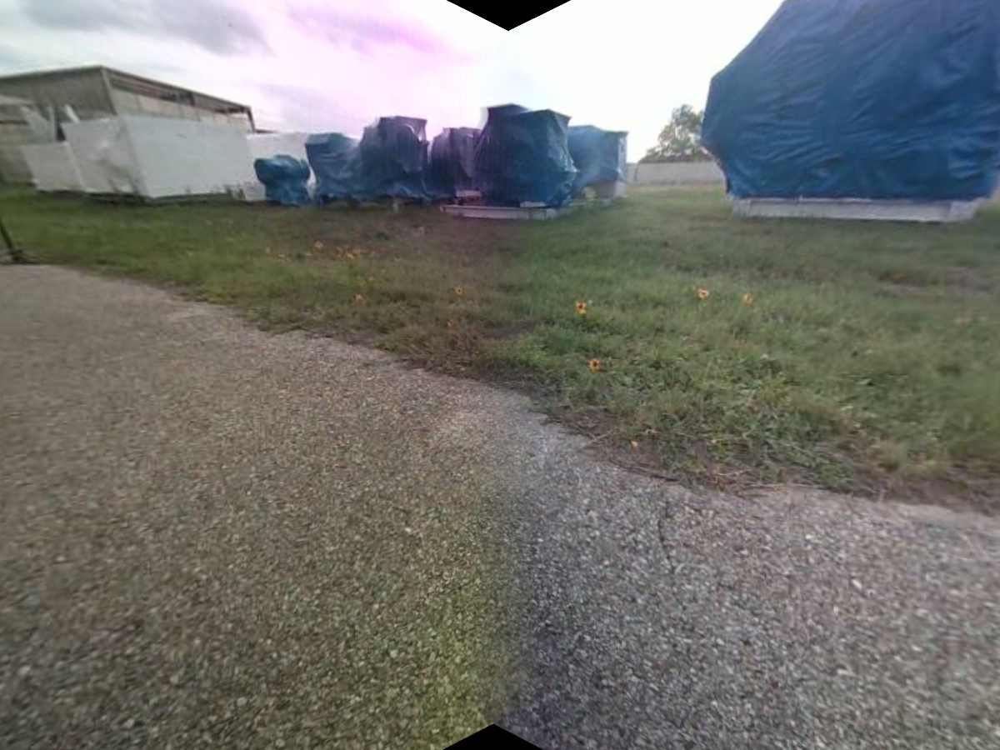

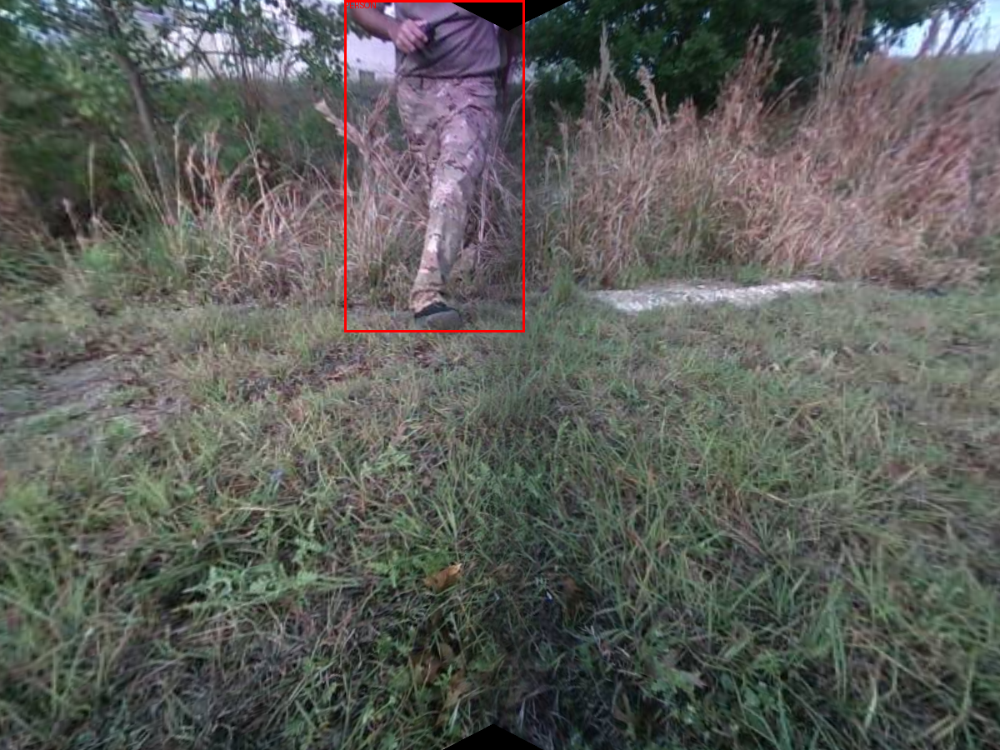

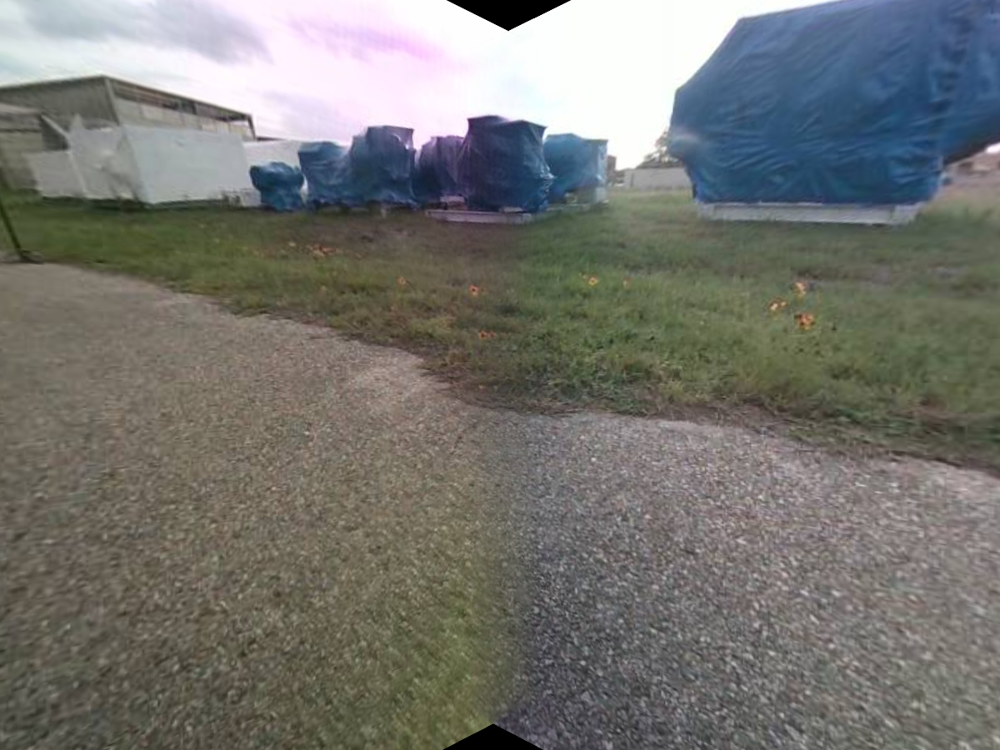

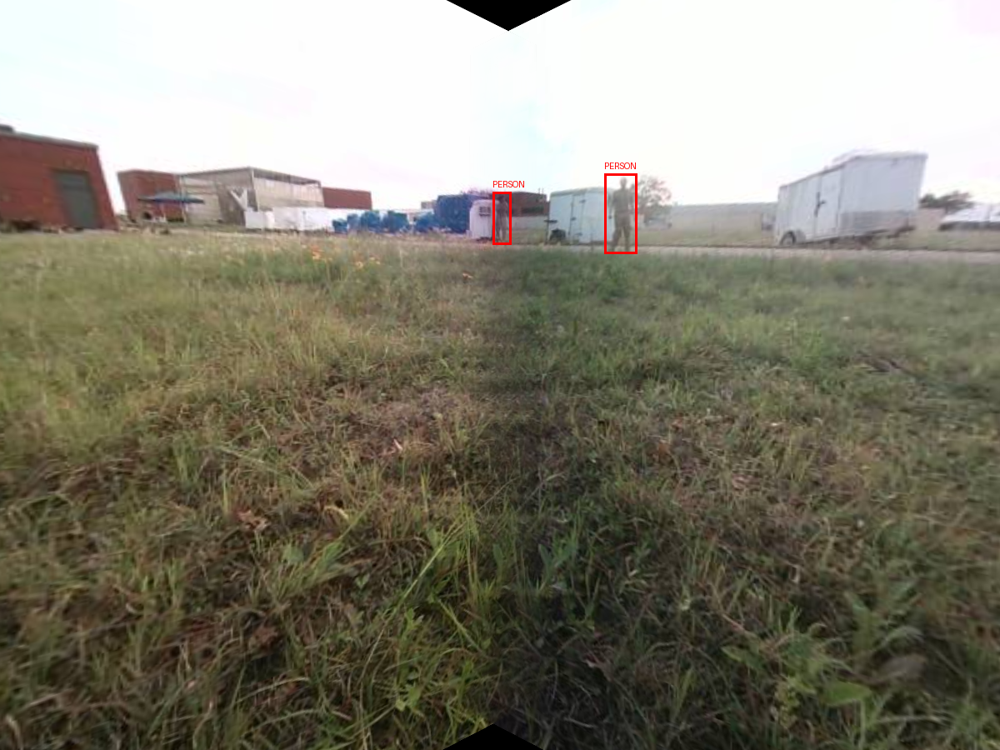

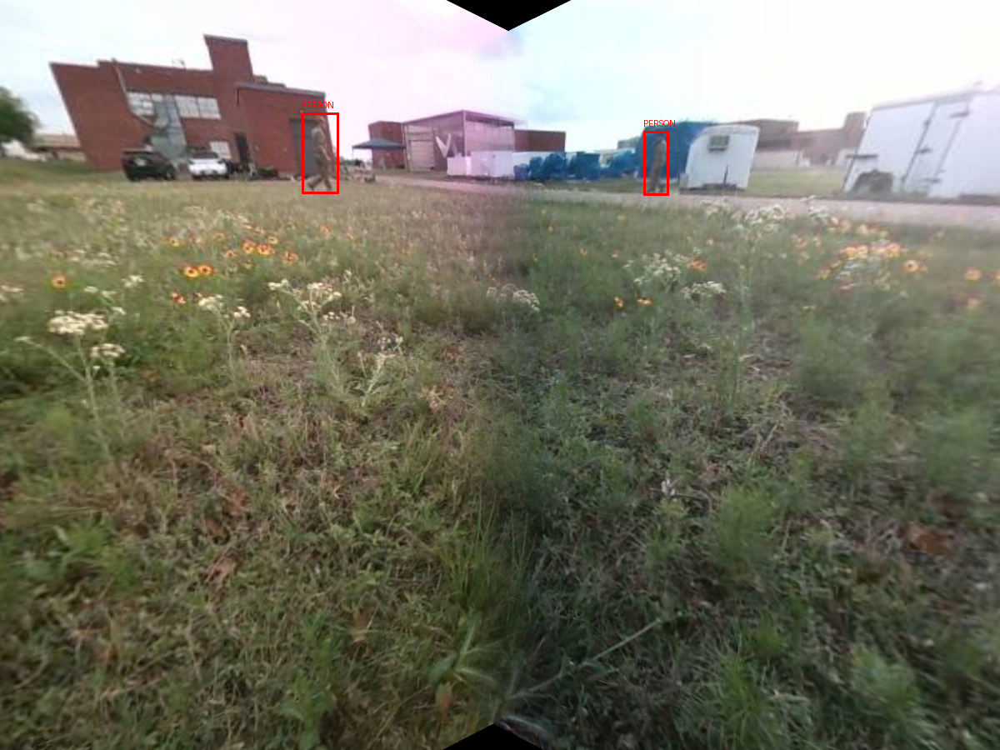

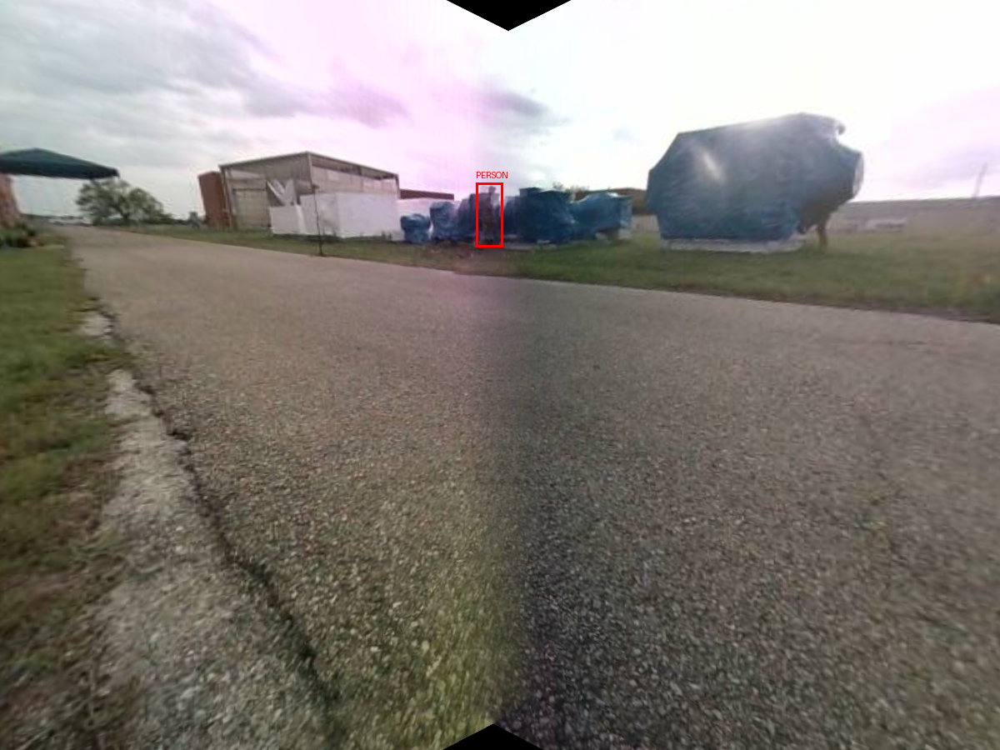


✅ Ground-truth bounding-box verification completed!


In [ ]:
import os
import random
from PIL import Image, ImageDraw

dataset = "/content/CoGLANCE_YOLO"

img_dir = os.path.join(dataset, "images", "val")
label_dir = os.path.join(dataset, "labels", "val")

images = [
    f for f in os.listdir(img_dir)
    if f.endswith(".png")
]

random.seed(42)
sample = random.sample(images, min(6, len(images)))

for img_name in sample:

    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(
        label_dir,
        img_name.replace(".png", ".txt")
    )

    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)

    W, H = img.size

    if os.path.exists(label_path):

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:

            parts = line.strip().split()

            if len(parts) != 5:
                continue

            _, xc, yc, bw, bh = map(float, parts)

            x1 = int((xc - bw / 2) * W)
            y1 = int((yc - bh / 2) * H)
            x2 = int((xc + bw / 2) * W)
            y2 = int((yc + bh / 2) * H)

            draw.rectangle(
                [x1, y1, x2, y2],
                outline="red",
                width=3
            )

            draw.text(
                (x1, max(0, y1 - 15)),
                "PERSON",
                fill="red"
            )

    display(img)

print("\n✅ Ground-truth bounding-box verification completed!")

In [ ]:
from ultralytics import YOLO

# Load your trained V1 model
model = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")

# Train V2 on Co-GLANCE
results = model.train(
    data="/content/CoGLANCE_YOLO/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,

    project="/content/UGV_training",
    name="person_detection_v2_coglance",

    # Helps preserve V1 knowledge while adapting to Co-GLANCE
    patience=10
)

Ultralytics 8.4.143 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/CoGLANCE_YOLO/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/UGV_person_detection_v1_best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name

In [ ]:
!cp /content/UGV_training/person_detection_v2_coglance/weights/best.pt \
"/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

!ls -lh "/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

-rw------- 1 root root 5.3M Sep  8 08:09 /content/drive/MyDrive/UGV_person_detection_v2_best.pt


In [ ]:
from ultralytics import YOLO
from pathlib import Path

# Load both models
v1 = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")
v2 = YOLO("/content/drive/MyDrive/UGV_person_detection_v2_best.pt")

test_dir = "/content/test_images/training images"

# V1
v1.predict(
    source=test_dir,
    conf=0.25,
    save=True,
    project="/content/V1_V2_comparison",
    name="V1"
)

# V2
v2.predict(
    source=test_dir,
    conf=0.25,
    save=True,
    project="/content/V1_V2_comparison",
    name="V2"
)

print("✅ V1 and V2 testing completed!")
print("V1 results → /content/V1_V2_comparison/V1")
print("V2 results → /content/V1_V2_comparison/V2")


image 1/7 /content/test_images/training images/1.jpeg: 384x640 1 person, 7.7ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 4 persons, 7.6ms
image 3/7 /content/test_images/training images/3.jpeg: 512x640 1 person, 12.9ms
image 4/7 /content/test_images/training images/4.jpeg: 480x640 2 persons, 8.6ms
image 5/7 /content/test_images/training images/5.jpeg: 640x448 2 persons, 8.7ms
image 6/7 /content/test_images/training images/6.jpeg: 384x640 1 person, 8.3ms
image 7/7 /content/test_images/training images/7.jpeg: 480x640 (no detections), 8.5ms
Speed: 1.5ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/V1_V2_comparison/V1

image 1/7 /content/test_images/training images/1.jpeg: 384x640 4 persons, 7.3ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 4 persons, 8.2ms
image 3/7 /content/test_images/training images/3.jpeg: 512x640 1 person, 10.2ms
image 4/7 /content/test_images/training images/4.jpe

In [ ]:
import shutil
from pathlib import Path

base = Path("/content/V1_V2_comparison")

# Create ZIP containing both V1 and V2 results
zip_path = shutil.make_archive(
    "/content/V1_V2_comparison_results",
    "zip",
    base
)

print("✅ ZIP created successfully!")
print("📦", zip_path)

✅ ZIP created successfully!
📦 /content/V1_V2_comparison_results.zip


In [ ]:
from google.colab import files

files.download("/content/V1_V2_comparison_results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/UGV_person_detection_v2_best.pt")

test_dir = "/content/test_images/training images"

for conf in [0.25, 0.35, 0.45, 0.55]:
    print(f"\n========== CONF = {conf} ==========")

    model.predict(
        source=test_dir,
        conf=conf,
        save=True,
        project="/content/V2_conf_test",
        name=f"conf_{int(conf*100)}"
    )

print("\n✅ Confidence comparison completed!")


========== CONF = 0.25 ==========

image 1/7 /content/test_images/training images/1.jpeg: 384x640 4 persons, 9.0ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 4 persons, 8.1ms
image 3/7 /content/test_images/training images/3.jpeg: 512x640 1 person, 8.4ms
image 4/7 /content/test_images/training images/4.jpeg: 480x640 (no detections), 8.6ms
image 5/7 /content/test_images/training images/5.jpeg: 640x448 9 persons, 9.1ms
image 6/7 /content/test_images/training images/6.jpeg: 384x640 1 person, 12.8ms
image 7/7 /content/test_images/training images/7.jpeg: 480x640 2 persons, 9.6ms
Speed: 1.8ms preprocess, 9.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/V2_conf_test/conf_25

========== CONF = 0.35 ==========

image 1/7 /content/test_images/training images/1.jpeg: 384x640 2 persons, 11.6ms
image 2/7 /content/test_images/training images/2.jpeg: 384x640 3 persons, 8.8ms
image 3/7 /content/test_images/training images/3.jpeg: 512x

In [ ]:
from ultralytics import YOLO

DATA = "/content/CoGLANCE_YOLO/data.yaml"

# Load both models
v1 = YOLO("/content/drive/MyDrive/UGV_person_detection_v1_best.pt")
v2 = YOLO("/content/drive/MyDrive/UGV_person_detection_v2_best.pt")

print("========== V1: KITTI MODEL ==========")

v1_results = v1.val(
    data=DATA,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    plots=True
)

print("\n========== V2: KITTI + Co-GLANCE MODEL ==========")

v2_results = v2.val(
    data=DATA,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    plots=True
)

print("\n✅ V1 vs V2 evaluation completed!")

========== V1: KITTI MODEL ==========
Ultralytics 8.4.143 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3776.6±603.6 MB/s, size: 1457.3 KB)
val: Scanning /content/CoGLANCE_YOLO/labels/val.cache... 131 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 131/131 27.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.7it/s 5.3s
                   all        131        186     0.0867     0.0914     0.0524     0.0159
Speed: 7.0ms preprocess, 7.2ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to /content/runs/detect/val

========== V2: KITTI + Co-GLANCE MODEL ==========
Ultralytics 8.4.143 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

for root, dirs, files in os.walk("/content/drive/MyDrive"):
    for f in files:
        if f.endswith(".zip"):
            print(os.path.join(root, f))

/content/drive/MyDrive/KITTI_PERSON_ready_to_train.zip
/content/drive/MyDrive/test_images.zip
/content/drive/MyDrive/omnisearch_annotated_ugv.zip


In [ ]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/omnisearch_annotated_ugv.zip"

extract_path = "/content/OmniSearch_UGV"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ OmniSearch UGV extracted")
print("Location:", extract_path)

✅ OmniSearch UGV extracted
Location: /content/OmniSearch_UGV


In [ ]:
import os

base = "/content/OmniSearch_UGV"

print("========== TOP LEVEL ==========")

for item in os.listdir(base):
    print(item)

print("\n========== SUB FOLDERS ==========")

for root, dirs, files in os.walk(base):
    level = root.replace(base, "").count(os.sep)

    if level <= 2:
        print("\n📂", root)
        print("Files:", files[:5])
        print("Folders:", dirs[:5])

========== TOP LEVEL ==========
ugv

========== SUB FOLDERS ==========

📂 /content/OmniSearch_UGV
Files: []
Folders: ['ugv']

📂 /content/OmniSearch_UGV/ugv
Files: []
Folders: ['mast', 'front']

📂 /content/OmniSearch_UGV/ugv/mast
Files: []
Folders: ['train', 'val']

📂 /content/OmniSearch_UGV/ugv/front
Files: []
Folders: ['train', 'val']


In [ ]:
import os

base = "/content/OmniSearch_UGV/ugv/front"

for root, dirs, files in os.walk(base):
    print("\n📂", root)
    print("Folders:", dirs)
    print("Files:", files[:10])


📂 /content/OmniSearch_UGV/ugv/front
Folders: ['train', 'val']
Files: []

📂 /content/OmniSearch_UGV/ugv/front/train
Folders: []
Files: ['00607.jpg', '01382.jpg', '00576.jpg', '01036.jpg', '00623.jpg', '01188.jpg', '00516.jpg', '00472.jpg', '01108.jpg', '01452.jpg']

📂 /content/OmniSearch_UGV/ugv/front/val
Folders: []
Files: ['00091.jpg', '00169.jpg', '00088.jpg', '00274.jpg', '00067.jpg', '00294.jpg', '00238.jpg', '00215.jpg', '00214.jpg', '00123.jpg']


In [ ]:
import os

base = "/content/OmniSearch_UGV"

for root, dirs, files in os.walk(base):
    for f in files:
        if f.endswith((".txt", ".json", ".xml", ".csv")):
            print(os.path.join(root, f))

In [ ]:
import os

base = "/content/OmniSearch_UGV"

found = False

for root, dirs, files in os.walk(base):
    for f in files:
        if f.endswith((".txt", ".json", ".xml", ".csv")):
            print(os.path.join(root, f))
            found = True

if not found:
    print("❌ No annotation files found")

❌ No annotation files found


In [ ]:
import os

for root, dirs, files in os.walk("/content/OmniSearch_UGV"):
    if files:
        print("\n📂", root)
        print("Total files:", len(files))
        print("Sample:", files[:3])


📂 /content/OmniSearch_UGV/ugv/mast/train
Total files: 1500
Sample: ['00607.jpg', '01382.jpg', '00576.jpg']

📂 /content/OmniSearch_UGV/ugv/mast/val
Total files: 300
Sample: ['00091.jpg', '00169.jpg', '00088.jpg']

📂 /content/OmniSearch_UGV/ugv/front/train
Total files: 1500
Sample: ['00607.jpg', '01382.jpg', '00576.jpg']

📂 /content/OmniSearch_UGV/ugv/front/val
Total files: 300
Sample: ['00091.jpg', '00169.jpg', '00088.jpg']


In [ ]:
import os

path="/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

print(os.path.exists(path))

True


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 62.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.9/68.9 kB 7.4 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import cv2

print("✅ Ultralytics ready")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
✅ Ultralytics ready


In [ ]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/test_images.zip"

extract_path = "/content/test_images"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Test images extracted")

✅ Test images extracted


In [ ]:
from ultralytics import YOLO
import cv2
import os

# ==========================
# LOAD FINAL MODEL
# ==========================

model_path = "/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

model = YOLO(model_path)

print("✅ Model loaded successfully")


# ==========================
# TEST IMAGE
# ==========================

image_path = "/content/test_images/training images/1.jpeg"

results = model(
    image_path,
    conf=0.35
)


# ==========================
# DISPLAY RESULT
# ==========================

for r in results:
    output = r.plot()

cv2.imwrite(
    "/content/inference_result.jpg",
    output
)

print("✅ Detection completed")
print("Saved: /content/inference_result.jpg")

✅ Model loaded successfully

image 1/1 /content/test_images/training images/1.jpeg: 384x640 2 persons, 377.0ms
Speed: 25.0ms preprocess, 377.0ms inference, 33.6ms postprocess per image at shape (1, 3, 384, 640)
✅ Detection completed
Saved: /content/inference_result.jpg


In [ ]:
%%writefile api.py

from fastapi import FastAPI, File, UploadFile
from fastapi.responses import JSONResponse
from ultralytics import YOLO
import shutil
import os


# ==========================
# LOAD MODEL
# ==========================

MODEL_PATH = "/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

model = YOLO(MODEL_PATH)


# ==========================
# FASTAPI APP
# ==========================

app = FastAPI(
    title="UGV Person Detection API",
    version="1.0"
)


# ==========================
# HOME
# ==========================

@app.get("/")
def home():
    return {
        "status": "UGV AI Backend Running"
    }


# ==========================
# DETECTION API
# ==========================

@app.post("/detect")
async def detect_person(
    file: UploadFile = File(...)
):

    # Save uploaded image temporarily
    image_path = "temp.jpg"

    with open(image_path, "wb") as buffer:
        shutil.copyfileobj(
            file.file,
            buffer
        )


    # YOLO inference
    results = model(
        image_path,
        conf=0.35
    )


    detections = []


    for r in results:

        boxes = r.boxes

        for box in boxes:

            confidence = float(
                box.conf[0]
            )

            cls = int(
                box.cls[0]
            )

            x1,y1,x2,y2 = map(
                int,
                box.xyxy[0]
            )


            detections.append(
                {
                    "class":"person",
                    "confidence":round(confidence,3),
                    "bbox":[x1,y1,x2,y2]
                }
            )


    return JSONResponse(
        {
            "person_detected":
                len(detections)>0,

            "count":
                len(detections),

            "detections":
                detections
        }
    )

Writing api.py


In [ ]:
%%writefile requirements.txt

ultralytics
fastapi
uvicorn
python-multipart
opencv-python

Writing requirements.txt


In [ ]:
!pip install fastapi uvicorn python-multipart

In [ ]:
!uvicorn api:app --host 0.0.0.0 --port 8000

INFO:     Started server process [6152]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)
INFO:     Shutting down
INFO:     Finished server process [6152]
ERROR:    Traceback (most recent call last):
  File "/usr/lib/python3.13/asyncio/runners.py", line 196, in run
    return runner.run(main)
           ~~~~~~~~~~^^^^^^
  File "/usr/lib/python3.13/asyncio/runners.py", line 119, in run
    return self._loop.run_until_complete(task)
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "uvloop/loop.pyx", line 1512, in uvloop.loop.Loop.run_until_complete
  File "uvloop/loop.pyx", line 1505, in uvloop.loop.Loop.run_until_complete
    self.run_forever()
  File "uvloop/loop.pyx", line 1379, in uvloop.loop.Loop.run_forever
    self._run(mode)
  File "uvloop/loop.pyx", line 557, in uvloop.loop.Loop._run
    raise self._last_error
  File "uvloop/loop.pyx", line 476, in uvloop.loop.Loop._on_i

In [ ]:
import requests

url = "http://127.0.0.1:8000/detect"

image_path = "/content/test_images/training images/1.jpeg"

with open(image_path, "rb") as img:
    response = requests.post(
        url,
        files={"file": img}
    )

print(response.status_code)
print(response.json())

200
{'person_detected': True, 'count': 2, 'detections': [{'class': 'person', 'confidence': 0.548, 'bbox': [520, 176, 596, 360]}, {'class': 'person', 'confidence': 0.493, 'bbox': [529, 170, 598, 258]}]}


In [ ]:
!nohup uvicorn api:app --host 0.0.0.0 --port 8000 &

nohup: appending output to 'nohup.out'


In [ ]:
import requests

url = "http://127.0.0.1:8000/detect"

image_path = "/content/test_images/training images/1.jpeg"

with open(image_path, "rb") as img:
    response = requests.post(
        url,
        files={"file": img}
    )

print("Status:", response.status_code)
print(response.json())

Status: 200
{'person_detected': True, 'count': 2, 'detections': [{'class': 'person', 'confidence': 0.548, 'bbox': [520, 176, 596, 360]}, {'class': 'person', 'confidence': 0.493, 'bbox': [529, 170, 598, 258]}]}


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/UGV_person_detection_v2_best.pt")

image_path = "/content/test_images/training images/1.jpeg"

results = model.predict(
    source=image_path,
    conf=0.35,
    iou=0.45,
    save=True
)

print("✅ NMS test completed")


image 1/1 /content/test_images/training images/1.jpeg: 384x640 2 persons, 98.5ms
Speed: 4.7ms preprocess, 98.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict
✅ NMS test completed


In [ ]:
import os

base = "/content/UGV_AI_Backend"

os.makedirs(base + "/model", exist_ok=True)

print("✅ Folder created")

✅ Folder created


In [ ]:
import shutil

src = "/content/drive/MyDrive/UGV_person_detection_v2_best.pt"

dst = "/content/UGV_AI_Backend/model/UGV_person_detection_v2_best.pt"

shutil.copy2(src, dst)

print("✅ Model copied")

✅ Model copied


In [ ]:
%%writefile /content/UGV_AI_Backend/requirements.txt

ultralytics
fastapi
uvicorn
python-multipart
opencv-python

Writing /content/UGV_AI_Backend/requirements.txt


In [ ]:
%%writefile /content/UGV_AI_Backend/README.md

# UGV Person Detection AI Backend

## Model
YOLO V2 trained on KITTI + Co-GLANCE dataset

## API

Endpoint:

POST /detect

Input:
Image file

Output:
Person detection JSON

Example:

{
 "person_detected": true,
 "count": 2,
 "detections": [
   {
    "class":"person",
    "confidence":0.85,
    "bbox":[x1,y1,x2,y2]
   }
 ]
}

## Run

pip install -r requirements.txt

uvicorn api:app --host 0.0.0.0 --port 8000

Writing /content/UGV_AI_Backend/README.md


In [ ]:
import shutil

src = "/content/api.py"

dst = "/content/UGV_AI_Backend/api.py"

shutil.copy2(src, dst)

print("✅ api.py copied")

✅ api.py copied


In [ ]:
import os

for root, dirs, files in os.walk("/content/UGV_AI_Backend"):
    print("\n📂", root)
    print("Files:", files)


📂 /content/UGV_AI_Backend
Files: ['README.md', 'requirements.txt', 'api.py']

📂 /content/UGV_AI_Backend/model
Files: ['UGV_person_detection_v2_best.pt']


In [ ]:
import shutil

shutil.make_archive(
    "/content/UGV_AI_Backend_Final",
    "zip",
    "/content/UGV_AI_Backend"
)

print("✅ Backend ZIP created")

✅ Backend ZIP created


In [ ]:
import shutil

shutil.copy(
    "/content/UGV_AI_Backend_Final.zip",
    "/content/drive/MyDrive/UGV_AI_Backend_Final.zip"
)

print("✅ Copied to Drive")

✅ Copied to Drive
